# Ну, начнём творить

Нам даны картинки и разметки для них, надо обучить модель object detection на 52 (Да здравствует Санкт-Петербург) класса и чтобы модель умела их детектить

Координаты в train-разметке нормализованы от 0 до 1

Метрика соревнования — AP при IoU = 0.5.

In [50]:
!pip install -q ultralytics

import os
import gc
import cv2
import yaml
import shutil
import random
import zipfile
from pathlib import Path
from collections import Counter, defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
from sklearn.model_selection import train_test_split
from ultralytics import YOLO

По правилам соревнования фиксирую все сиды равными 993, ещё добавляю функцию использования GPU, т.к. если локально на ноуте запускать, то обучаться будет вечность 



In [51]:
SEED = 993

def seed_everything(seed: int = SEED):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)

    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True

seed_everything(SEED)

DEVICE = 0 if torch.cuda.is_available() else "cpu"

print("SEED:", SEED)
print("CUDA available:", torch.cuda.is_available())
print("DEVICE:", DEVICE)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

SEED: 993
CUDA available: True
DEVICE: 0
GPU: Tesla T4


# Распаковываю данные

Я запускал код в каггле и там автоматически распаковывается зипка, если локально, то надо добавить код открывания зипки

Ниже я написал универсальный код: если каггл, то беру данные из "/kaggle/input", а если локально, то распаковываю зипку

In [52]:
PROJECT_ROOT = Path.cwd()

IS_KAGGLE = Path("/kaggle/input").exists()
KAGGLE_INPUT_DIR = Path("/kaggle/input")
KAGGLE_WORK_DIR = Path("/kaggle/working")

if KAGGLE_WORK_DIR.exists():
    WORK_DIR = KAGGLE_WORK_DIR
else:
    WORK_DIR = PROJECT_ROOT

WORK_DIR.mkdir(parents=True, exist_ok=True)

print("PROJECT_ROOT:", PROJECT_ROOT)
print("WORK_DIR:", WORK_DIR)
print("IS_KAGGLE:", IS_KAGGLE)

def looks_like_dataset_root(path: Path) -> bool:
    direct_structure = (
        (path / "train" / "images").exists()
        and (path / "train" / "labels").exists()
        and (path / "test" / "images").exists()
    )

    nested_structure = (
        (path / "train" / "train" / "images").exists()
        and (path / "train" / "train" / "labels").exists()
        and (path / "test" / "test" / "images").exists()
    )

    return direct_structure or nested_structure


def find_dataset_root(search_root: Path) -> Path | None:
    if not search_root.exists():
        return None

    candidates = [search_root] + [p for p in search_root.rglob("*") if p.is_dir()]

    for path in candidates:
        if looks_like_dataset_root(path):
            return path

    return None


ROOT_DIR = None

# запуск в Kaggle
if IS_KAGGLE:
    ROOT_DIR = find_dataset_root(KAGGLE_INPUT_DIR)

    if ROOT_DIR is not None:
        print("Датасет найден в Kaggle input:", ROOT_DIR)


# запуск из репозитория
if ROOT_DIR is None:
    zip_candidates = sorted(PROJECT_ROOT.glob("*.zip"))
    for p in zip_candidates:
        print(" -", p.name)

    assert len(zip_candidates) > 0, ("Не найден zip")

    ZIP_PATH = zip_candidates[0]
    EXTRACT_DIR = WORK_DIR / "competition_data_unpacked"

    print(ZIP_PATH)
    print(EXTRACT_DIR)

    if EXTRACT_DIR.exists():
        shutil.rmtree(EXTRACT_DIR)

    EXTRACT_DIR.mkdir(parents=True, exist_ok=True)

    with zipfile.ZipFile(ZIP_PATH, "r") as zip_ref:
        zip_ref.extractall(EXTRACT_DIR)

    ROOT_DIR = find_dataset_root(EXTRACT_DIR)

    assert ROOT_DIR is not None, ("ошибка поиска структуры бд")


print()
print("итоговый ROOT_DIR:", ROOT_DIR)

for path in sorted(ROOT_DIR.iterdir()):
    print(path)

PROJECT_ROOT: /kaggle/working
WORK_DIR: /kaggle/working
IS_KAGGLE: True
Датасет найден в Kaggle input: /kaggle/input/datasets/vdoron/homework

итоговый ROOT_DIR: /kaggle/input/datasets/vdoron/homework
/kaggle/input/datasets/vdoron/homework/sample_submission.csv
/kaggle/input/datasets/vdoron/homework/test
/kaggle/input/datasets/vdoron/homework/train


# Определение путей к изображениям и разметке

После того как найдена корневая папка датасета, задаю пути к основным частям данных:

- тренировочные изображения
- файлы разметки
- тестовые изображения

In [53]:
TRAIN_IMAGE_DIR = ROOT_DIR / "train" / "images"
TRAIN_LABEL_DIR = ROOT_DIR / "train" / "labels"
TEST_IMAGE_DIR = ROOT_DIR / "test" / "images"

if not TRAIN_IMAGE_DIR.exists():
    TRAIN_IMAGE_DIR = ROOT_DIR / "train" / "train" / "images"

if not TRAIN_LABEL_DIR.exists():
    TRAIN_LABEL_DIR = ROOT_DIR / "train" / "train" / "labels"

if not TEST_IMAGE_DIR.exists():
    TEST_IMAGE_DIR = ROOT_DIR / "test" / "test" / "images"

print("train_img:", TRAIN_IMAGE_DIR)
print("train_label:", TRAIN_LABEL_DIR)
print("test_img:", TEST_IMAGE_DIR)

print()
print("train_img_exists:", TRAIN_IMAGE_DIR.exists())
print("train_labels_exists:", TRAIN_LABEL_DIR.exists())
print("test_img_exists:", TEST_IMAGE_DIR.exists())

train_img: /kaggle/input/datasets/vdoron/homework/train/train/images
train_label: /kaggle/input/datasets/vdoron/homework/train/train/labels
test_img: /kaggle/input/datasets/vdoron/homework/test/test/images

train_img_exists: True
train_labels_exists: True
test_img_exists: True


# Собираю списки тренировочных изображений c файлами разметки и тестовых изображений

Количество train должно совпадать с labels

In [54]:
train_images = sorted([
    path for path in TRAIN_IMAGE_DIR.iterdir()
    if path.suffix.lower() == '.jpg'
])

test_images = sorted([
    path for path in TEST_IMAGE_DIR.iterdir()
    if path.suffix.lower() == '.jpg'
])

train_labels = sorted(TRAIN_LABEL_DIR.glob("*.txt"))

print("train images:", len(train_images))
print("train labels:", len(train_labels))
print("test images:", len(test_images))

train images: 1697
train labels: 1697
test images: 424


# Чтение YOLO-разметки

Train-разметка хранится в формате YOLO  
Каждый label-файл соответствует одному изображению и содержит строки вида:

class_id x_center y_center width height

Для анализа и визуализации bbox я дополнительно перевожу координаты в формат x_min, y_min, x_max, y_max в пикселях

In [55]:
def read_yolo_label(label_path: Path):
    objects = []

    if not label_path.exists():
        return objects

    with open(label_path, "r", encoding="utf-8") as file:
        lines = file.read().strip().splitlines()

    for line in lines:
        if line.strip() == "":
            continue

        parts = line.split()

        if len(parts) != 5:
            continue

        class_id = int(parts[0])
        x_center = float(parts[1])
        y_center = float(parts[2])
        width = float(parts[3])
        height = float(parts[4])

        objects.append({
            "class_id": class_id,
            "x_center": x_center,
            "y_center": y_center,
            "width": width,
            "height": height,
        })

    return objects


def yolo_to_xyxy(obj, image_width, image_height):
    x_center = obj["x_center"] * image_width
    y_center = obj["y_center"] * image_height

    box_width = obj["width"] * image_width
    box_height = obj["height"] * image_height

    x_min = x_center - box_width / 2
    y_min = y_center - box_height / 2
    x_max = x_center + box_width / 2
    y_max = y_center + box_height / 2

    x_min = max(0, min(x_min, image_width - 1))
    y_min = max(0, min(y_min, image_height - 1))
    x_max = max(0, min(x_max, image_width - 1))
    y_max = max(0, min(y_max, image_height - 1))

    return [x_min, y_min, x_max, y_max]

# пример чтения одного файла

In [56]:
sample_label_path = train_labels[0]
sample_objects = read_yolo_label(sample_label_path)

print("label path:", sample_label_path)
print("objects count:", len(sample_objects))
print("first objects:", sample_objects[:5])

label path: /kaggle/input/datasets/vdoron/homework/train/train/labels/IMG20240219113638_jpg.rf.ff06b9b93da9ca10600f9c4ababc261f.txt
objects count: 11
first objects: [{'class_id': 16, 'x_center': 0.5546875, 'y_center': 0.3125, 'width': 0.090625, 'height': 0.07109375}, {'class_id': 16, 'x_center': 0.63203125, 'y_center': 0.37578125, 'width': 0.096875, 'height': 0.0703125}, {'class_id': 45, 'x_center': 0.48671875, 'y_center': 0.6140625, 'width': 0.11015625, 'height': 0.08828125}, {'class_id': 20, 'x_center': 0.4921875, 'y_center': 0.4078125, 'width': 0.13515625, 'height': 0.07109375}, {'class_id': 37, 'x_center': 0.47578125, 'y_center': 0.4953125, 'width': 0.1453125, 'height': 0.1015625}]


# создание train_df

In [57]:
train_records = []

for image_path in train_images:
    label_path = TRAIN_LABEL_DIR / f"{image_path.stem}.txt"

    image = cv2.imread(str(image_path))

    if image is None:
        print("bad image:", image_path)
        continue

    image_height, image_width = image.shape[:2]

    objects = read_yolo_label(label_path)

    classes = []
    boxes = []

    for obj in objects:
        box = yolo_to_xyxy(obj, image_width, image_height)
        x_min, y_min, x_max, y_max = box

        if x_max > x_min and y_max > y_min:
            classes.append(obj["class_id"])
            boxes.append(box)

    train_records.append({
        "image_id": image_path.stem,
        "image_name": image_path.name,
        "image_path": str(image_path),
        "label_path": str(label_path),
        "width": image_width,
        "height": image_height,
        "num_objects": len(boxes),
        "classes": classes,
        "boxes": boxes,
    })

train_df = pd.DataFrame(train_records)

display(train_df.head())

print("Train images in dataframe:", len(train_df))
print("Images without objects:", (train_df["num_objects"] == 0).sum())

,image_id,image_name,image_path,label_path,width,height,num_objects,classes,boxes
0,IMG20240219113638_jpg.rf.ff06b9b93da9ca10600f9...,IMG20240219113638_jpg.rf.ff06b9b93da9ca10600f9...,/kaggle/input/datasets/vdoron/homework/train/t...,/kaggle/input/datasets/vdoron/homework/train/t...,640,640,11,"[16, 16, 45, 20, 37, 34, 34, 34, 50, 34, 45]","[[326.0, 177.25, 384.0, 222.75], [373.5, 218.0..."
1,IMG20240219113649_jpg.rf.0aa36d5700345b509e0a4...,IMG20240219113649_jpg.rf.0aa36d5700345b509e0a4...,/kaggle/input/datasets/vdoron/homework/train/t...,/kaggle/input/datasets/vdoron/homework/train/t...,640,640,11,"[45, 45, 50, 34, 34, 34, 34, 37, 16, 16, 20]","[[215.25, 389.25, 311.75, 544.75], [339.75, 39..."
2,IMG20240219113715_jpg.rf.a71fa6e6f4be2b70af832...,IMG20240219113715_jpg.rf.a71fa6e6f4be2b70af832...,/kaggle/input/datasets/vdoron/homework/train/t...,/kaggle/input/datasets/vdoron/homework/train/t...,640,640,11,"[45, 45, 50, 34, 34, 34, 34, 37, 16, 16, 20]","[[385.5, 200.25, 438.5, 292.75], [377.25, 309...."
3,IMG20240219113726_jpg.rf.55744d06df6f9a980cafa...,IMG20240219113726_jpg.rf.55744d06df6f9a980cafa...,/kaggle/input/datasets/vdoron/homework/train/t...,/kaggle/input/datasets/vdoron/homework/train/t...,640,640,11,"[50, 34, 20, 34, 34, 34, 45, 37, 16, 16, 45]","[[257.75, 23.0, 303.25, 164.0], [348.0, 170.75..."
4,IMG20240219113745_jpg.rf.06494033a07fb1bb98e68...,IMG20240219113745_jpg.rf.06494033a07fb1bb98e68...,/kaggle/input/datasets/vdoron/homework/train/t...,/kaggle/input/datasets/vdoron/homework/train/t...,640,640,10,"[45, 45, 34, 34, 34, 37, 16, 16, 20, 6]","[[439.0, 151.25, 546.0, 223.75], [346.75, 74.2..."


Train images in dataframe: 1697
Images without objects: 0


# визуализация bbox для проверки и просмотра

In [58]:
bbox_records = []

for _, row in train_df.iterrows():
    image_area = row["width"] * row["height"]

    for class_id, box in zip(row["classes"], row["boxes"]):
        x_min, y_min, x_max, y_max = box

        box_width = x_max - x_min
        box_height = y_max - y_min
        box_area = box_width * box_height

        bbox_records.append({
            "image_id": row["image_id"],
            "class_id": class_id,
            "box_width": box_width,
            "box_height": box_height,
            "box_area": box_area,
            "relative_area": box_area / image_area,
        })

bbox_df = pd.DataFrame(bbox_records)

display(bbox_df.head())

print("total objects:", len(bbox_df))
print("min class:", bbox_df["class_id"].min())
print("max class:", bbox_df["class_id"].max())

display(bbox_df[["box_width", "box_height", "box_area", "relative_area"]].describe())

,image_id,class_id,box_width,box_height,box_area,relative_area
0,IMG20240219113638_jpg.rf.ff06b9b93da9ca10600f9...,16,58.0,45.5,2639.00,0.006443
1,IMG20240219113638_jpg.rf.ff06b9b93da9ca10600f9...,16,62.0,45.0,2790.00,0.006812
2,IMG20240219113638_jpg.rf.ff06b9b93da9ca10600f9...,45,70.5,56.5,3983.25,0.009725
3,IMG20240219113638_jpg.rf.ff06b9b93da9ca10600f9...,20,86.5,45.5,3935.75,0.009609
4,IMG20240219113638_jpg.rf.ff06b9b93da9ca10600f9...,37,93.0,65.0,6045.00,0.014758


total objects: 10498
min class: 0
max class: 51


,box_width,box_height,box_area,relative_area
count,10498.000000,10498.000000,10498.000000,10498.000000
mean,121.549700,136.146647,20992.034376,0.051250
std,75.870126,82.775505,27488.812203,0.067111
min,12.000000,15.500000,255.750000,0.000624
25%,67.000000,76.500000,5463.625000,0.013339
50%,104.500000,117.000000,12073.125000,0.029475
75%,156.500000,175.000000,25198.125000,0.061519
max,639.000000,639.000000,363341.000000,0.887063


# EDA по классам

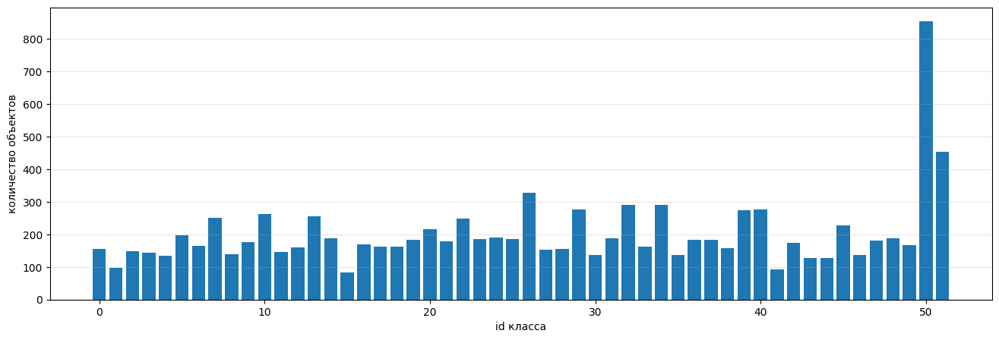

In [59]:
class_counts = bbox_df["class_id"].value_counts().sort_index()

plt.figure(figsize=(16, 5))
plt.bar(class_counts.index, class_counts.values)
plt.xlabel("id класса")
plt.ylabel("количество объектов")
plt.grid(axis="y", alpha=0.3)
plt.show()

# EDA по размерам изображений и bbox

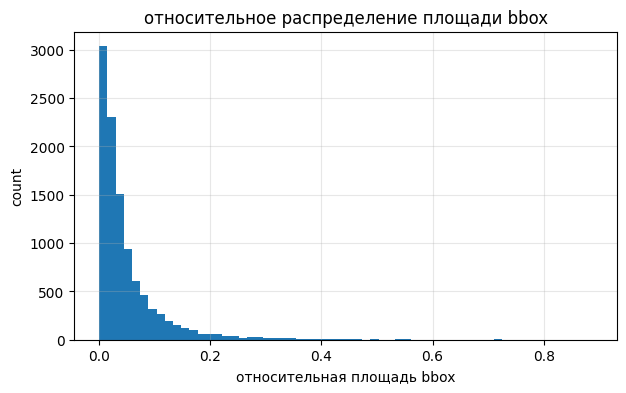

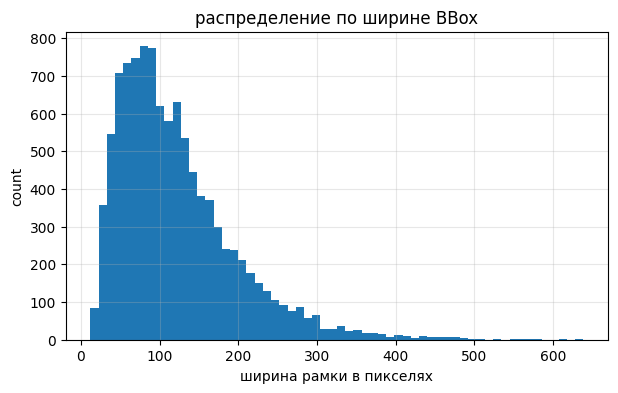

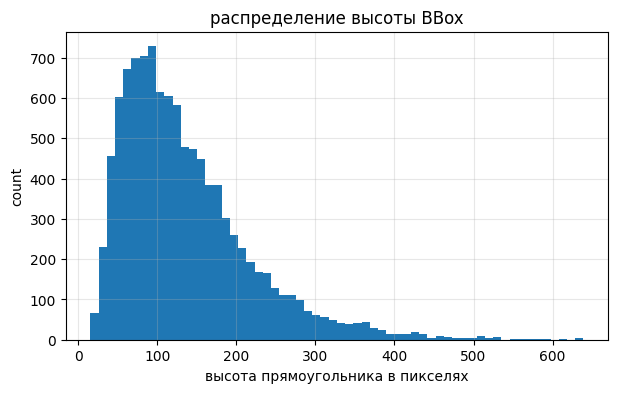

In [60]:
plt.figure(figsize=(7, 4))
plt.hist(bbox_df["relative_area"], bins=60)
plt.title("относительное распределение площади bbox")
plt.xlabel("относительная площадь bbox")
plt.ylabel("count")
plt.grid(alpha=0.3)
plt.show()

plt.figure(figsize=(7, 4))
plt.hist(bbox_df["box_width"], bins=60)
plt.title("распределение по ширине BBox")
plt.xlabel("ширина рамки в пикселях")
plt.ylabel("count")
plt.grid(alpha=0.3)
plt.show()

plt.figure(figsize=(7, 4))
plt.hist(bbox_df["box_height"], bins=60)
plt.title("распределение высоты BBox")
plt.xlabel("высота прямоугольника в пикселях")
plt.ylabel("count")
plt.grid(alpha=0.3)
plt.show()

# визуальная проверка разметки

перед обучением модели просто проверяю несколько изображений с нанесёнными bounding box

In [61]:
def show_image_with_boxes(image_path, max_boxes=100):
    image_path = Path(image_path)
    label_path = TRAIN_LABEL_DIR / f"{image_path.stem}.txt"

    image = cv2.imread(str(image_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    image_height, image_width = image.shape[:2]

    objects = read_yolo_label(label_path)

    plt.figure(figsize=(8, 8))
    plt.imshow(image)

    ax = plt.gca()

    for obj in objects[:max_boxes]:
        x_min, y_min, x_max, y_max = yolo_to_xyxy(obj, image_width, image_height)

        rect = plt.Rectangle(
            (x_min, y_min),
            x_max - x_min,
            y_max - y_min,
            fill=False,
            linewidth=2,
            edgecolor="red",
        )

        ax.add_patch(rect)

        ax.text(
            x_min,
            max(0, y_min - 5),
            str(obj["class_id"]),
            color="white",
            fontsize=9,
            bbox=dict(facecolor="red", alpha=0.7),
        )

    plt.title(image_path.name)
    plt.axis("off")
    plt.show()

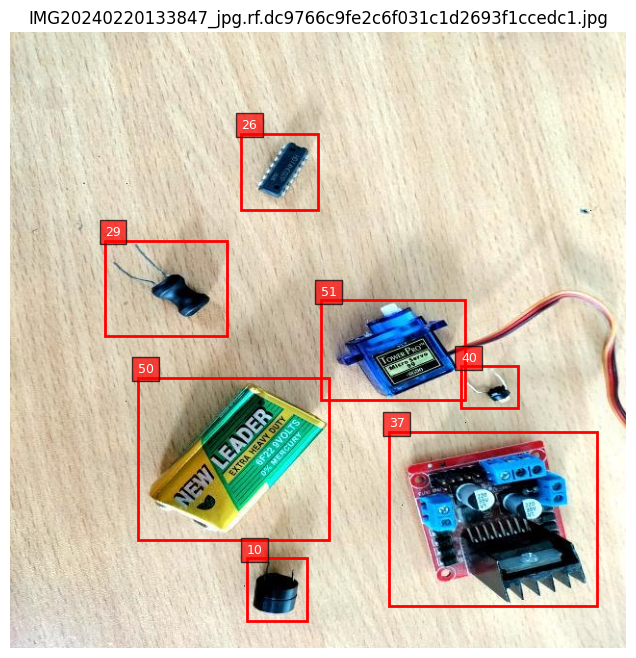

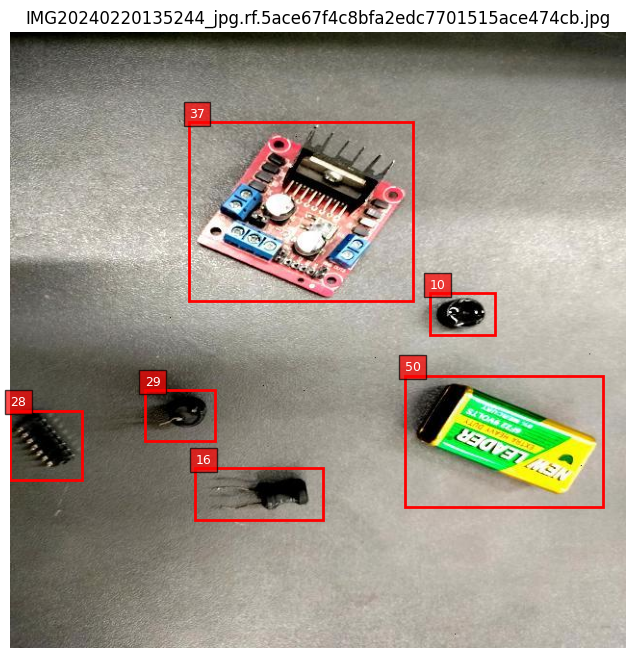

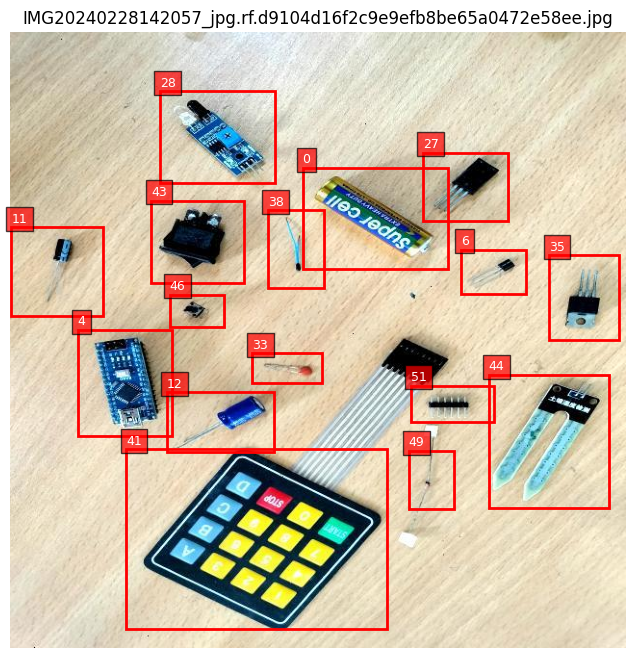

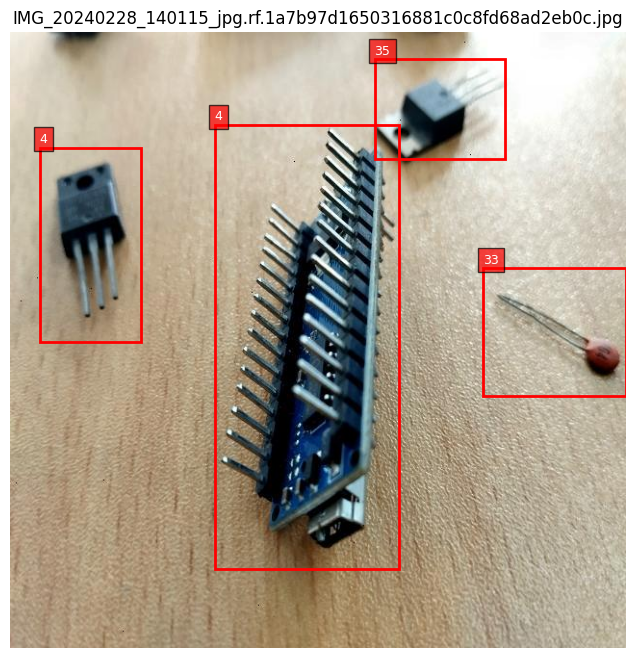

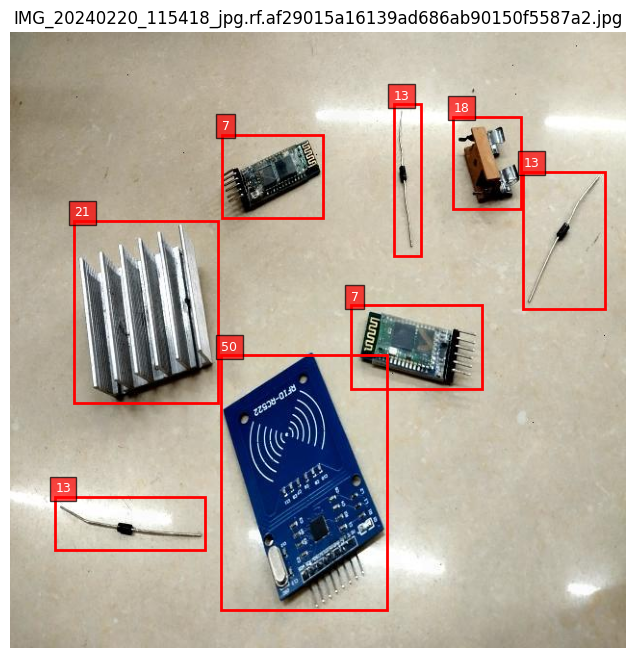

In [62]:
sample_images = random.sample(train_images, min(5, len(train_images)))

for image_path in sample_images:
    show_image_with_boxes(image_path)

# train/valid split

Делю датасет на две части: train и valid

In [63]:
train_df = train_df.reset_index(drop=True)

def get_main_class(classes):
    if len(classes) == 0:
        return -1
    return Counter(classes).most_common(1)[0][0]

train_df["main_class"] = train_df["classes"].apply(get_main_class)

class_counts_for_split = train_df["main_class"].value_counts()
can_stratify = train_df["main_class"].map(class_counts_for_split).min() >= 2

print("Can stratify:", can_stratify)

if can_stratify:
    stratify_values = train_df["main_class"]
else:
    stratify_values = None

train_part, valid_part = train_test_split(
    train_df,
    test_size=0.15,
    random_state=SEED,
    shuffle=True,
    stratify=stratify_values,
)

train_part = train_part.reset_index(drop=True)
valid_part = valid_part.reset_index(drop=True)

print("train img:", len(train_part))
print("valid img:", len(valid_part))

print("train obj:", train_part["num_objects"].sum())
print("valid obj:", valid_part["num_objects"].sum())

Can stratify: True
train img: 1442
valid img: 255
train obj: 8975
valid obj: 1523


# создание YOLO-датасета

Библиотека Ultralytics ожидает определённую структуру папок для обучения YOLO-модели, следовательно, надо создать отдельную рабочую директорию, внутри которой данные раскладываются в формате: train/images, train/labels, valid/images, valid/labels

In [64]:
YOLO_DATASET_DIR = WORK_DIR / "yolo_dataset_seed993"

YOLO_TRAIN_IMAGE_DIR = YOLO_DATASET_DIR / "train" / "images"
YOLO_TRAIN_LABEL_DIR = YOLO_DATASET_DIR / "train" / "labels"

YOLO_VALID_IMAGE_DIR = YOLO_DATASET_DIR / "valid" / "images"
YOLO_VALID_LABEL_DIR = YOLO_DATASET_DIR / "valid" / "labels"

if YOLO_DATASET_DIR.exists():
    shutil.rmtree(YOLO_DATASET_DIR)

for directory in [
    YOLO_TRAIN_IMAGE_DIR,
    YOLO_TRAIN_LABEL_DIR,
    YOLO_VALID_IMAGE_DIR,
    YOLO_VALID_LABEL_DIR,
]:
    directory.mkdir(parents=True, exist_ok=True)

print(YOLO_DATASET_DIR.resolve())

/kaggle/working/yolo_dataset_seed993


# Копирование train/valid в YOLO-структуру

In [65]:
def copy_image_and_label(row, dst_image_dir, dst_label_dir):
    src_image_path = Path(row["image_path"])
    src_label_path = Path(row["label_path"])

    dst_image_path = dst_image_dir / src_image_path.name
    dst_label_path = dst_label_dir / src_label_path.name

    shutil.copy2(src_image_path, dst_image_path)
    shutil.copy2(src_label_path, dst_label_path)


for _, row in train_part.iterrows():
    copy_image_and_label(row, YOLO_TRAIN_IMAGE_DIR, YOLO_TRAIN_LABEL_DIR)

for _, row in valid_part.iterrows():
    copy_image_and_label(row, YOLO_VALID_IMAGE_DIR, YOLO_VALID_LABEL_DIR)

print("сopy train img:", len(list(YOLO_TRAIN_IMAGE_DIR.iterdir())))
print("сopy train labels:", len(list(YOLO_TRAIN_LABEL_DIR.glob('*.txt'))))

print("сopy valid img:", len(list(YOLO_VALID_IMAGE_DIR.iterdir())))
print("сopy valid labels:", len(list(YOLO_VALID_LABEL_DIR.glob('*.txt'))))

сopy train img: 1442
сopy train labels: 1442
сopy valid img: 255
сopy valid labels: 255


# Проверка корректности YOLO-разметки

Перед обучением выполняется дополнительная проверка label-файлов

Проверяются две основные проблемы:

- Для изображения отсутствует label-файл
- В label-файле есть некорректные строки

In [66]:
def check_yolo_labels(image_dir, label_dir):
    image_paths = sorted([
        path for path in image_dir.iterdir()
        if path.suffix.lower() == '.jpg'
    ])

    missing_labels = []
    bad_labels = []

    for image_path in image_paths:
        label_path = label_dir / f"{image_path.stem}.txt"

        if not label_path.exists():
            missing_labels.append(image_path.name)
            continue

        objects = read_yolo_label(label_path)

        for obj in objects:
            class_id = obj["class_id"]
            x_center = obj["x_center"]
            y_center = obj["y_center"]
            width = obj["width"]
            height = obj["height"]

            if not (0 <= class_id < 52):
                bad_labels.append((label_path.name, "bad_class", class_id))

            if not (0 <= x_center <= 1):
                bad_labels.append((label_path.name, "bad_x_center", x_center))

            if not (0 <= y_center <= 1):
                bad_labels.append((label_path.name, "bad_y_center", y_center))

            if not (0 < width <= 1):
                bad_labels.append((label_path.name, "bad_width", width))

            if not (0 < height <= 1):
                bad_labels.append((label_path.name, "bad_height", height))

    return missing_labels, bad_labels


missing_train, bad_train = check_yolo_labels(YOLO_TRAIN_IMAGE_DIR, YOLO_TRAIN_LABEL_DIR)
missing_valid, bad_valid = check_yolo_labels(YOLO_VALID_IMAGE_DIR, YOLO_VALID_LABEL_DIR)

print("missing train labels:", len(missing_train))
print("bad train labels:", len(bad_train))

print("missing valid labels:", len(missing_valid))
print("bad valid labels:", len(bad_valid))

assert len(missing_train) == 0
assert len(missing_valid) == 0
assert len(bad_train) == 0
assert len(bad_valid) == 0

missing train labels: 0
bad train labels: 0
missing valid labels: 0
bad valid labels: 0


# cоздание файла data.yaml

Для запуска обучения YOLO нужен конфигурационный файл data.yaml, в котором указываются:

- путь к датасету
- путь к train-изображениям
- путь к validation-изображениям
- количество классов
- названия классов

In [67]:
YOLO_DATA_YAML_PATH = YOLO_DATASET_DIR / "data.yaml"

data_yaml = {
    "path": YOLO_DATASET_DIR.resolve().as_posix(),
    "train": "train/images",
    "val": "valid/images",
    "nc": 52,
    "names": [str(i) for i in range(52)],
}

with open(YOLO_DATA_YAML_PATH, "w", encoding="utf-8") as file:
    yaml.safe_dump(data_yaml, file, sort_keys=False, allow_unicode=True)

print(open(YOLO_DATA_YAML_PATH, "r", encoding="utf-8").read())

path: /kaggle/working/yolo_dataset_seed993
train: train/images
val: valid/images
nc: 52
names:
- '0'
- '1'
- '2'
- '3'
- '4'
- '5'
- '6'
- '7'
- '8'
- '9'
- '10'
- '11'
- '12'
- '13'
- '14'
- '15'
- '16'
- '17'
- '18'
- '19'
- '20'
- '21'
- '22'
- '23'
- '24'
- '25'
- '26'
- '27'
- '28'
- '29'
- '30'
- '31'
- '32'
- '33'
- '34'
- '35'
- '36'
- '37'
- '38'
- '39'
- '40'
- '41'
- '42'
- '43'
- '44'
- '45'
- '46'
- '47'
- '48'
- '49'
- '50'
- '51'



# функции кастомных аугментаций

Т.к. тестовые изображения визуально отличаются от чистых тренировочных данных, у них много шумов, точек и полос, в решении использую доп аугментации

В данном решении использую такие эффекты:

- размытие
- шум
- потери качества
- grayscale-преобразование
- случайные визуальные артефакты
- тёмные линии и загрязнения

In [68]:
def stable_hash_from_string(s: str):
    value = 0

    for ch in s:
        value = (value * 31 + ord(ch)) % 1_000_000_007

    return value


def as_uint8(image):
    return np.clip(image, 0, 255).astype(np.uint8)


def add_rgb_gaussian_noise(
    image,
    rng,
    sigma_min=18,
    sigma_max=78,
):
    sigma = float(rng.uniform(sigma_min, sigma_max))
    noise = rng.normal(0, sigma, image.shape).astype(np.float32)

    out = image.astype(np.float32) + noise
    return as_uint8(out)


def add_dense_dirty_blobs(
    image,
    rng,
    min_count=120,
    max_count=360,
    min_radius=1,
    max_radius=8,
    min_alpha=0.06,
    max_alpha=0.18,
):
    out = image.astype(np.float32).copy()
    h, w = out.shape[:2]

    area_scale = (h * w) / (768 * 768)
    count = int(rng.integers(min_count, max_count + 1) * max(0.45, area_scale))

    mask = np.zeros((h, w), dtype=np.float32)

    for _ in range(count):
        cx = int(rng.integers(0, w))
        cy = int(rng.integers(0, h))

        r1 = int(rng.integers(min_radius, max_radius + 1))
        r2 = int(rng.integers(min_radius, max_radius + 1))
        angle = float(rng.uniform(0, 180))

        cv2.ellipse(
            mask,
            center=(cx, cy),
            axes=(r1, r2),
            angle=angle,
            startAngle=0,
            endAngle=360,
            color=1.0,
            thickness=-1,
        )

    blur_k = int(rng.choice([3, 5, 7]))
    mask = cv2.GaussianBlur(mask, (blur_k, blur_k), sigmaX=float(rng.uniform(0.5, 1.8)))
    mask = np.clip(mask, 0.0, 1.0)

    alpha = float(rng.uniform(min_alpha, max_alpha))

    if rng.random() < 0.78:
        dirt_color = rng.uniform(0, 45, size=(1, 1, 3)).astype(np.float32)
    else:
        dirt_color = rng.uniform(210, 255, size=(1, 1, 3)).astype(np.float32)

    mask_3ch = mask[..., None]

    out = out * (1.0 - alpha * mask_3ch) + dirt_color * (alpha * mask_3ch)

    return as_uint8(out)


def add_black_white_speckles(
    image,
    rng,
    min_ratio=0.0015,
    max_ratio=0.0060,
    cluster_min=40,
    cluster_max=180,
):
    
    out = image.copy()
    h, w = out.shape[:2]

    pixel_count = int(h * w * rng.uniform(min_ratio, max_ratio))

    ys = rng.integers(0, h, size=pixel_count)
    xs = rng.integers(0, w, size=pixel_count)

    values = rng.choice([0, 255], size=pixel_count, p=[0.48, 0.52]).astype(np.uint8)
    out[ys, xs] = values[:, None]

    cluster_count = int(rng.integers(cluster_min, cluster_max + 1))

    for _ in range(cluster_count):
        cx = int(rng.integers(0, w))
        cy = int(rng.integers(0, h))
        radius = int(rng.integers(1, 3))
        value = int(0 if rng.random() < 0.50 else 255)

        cv2.circle(
            out,
            center=(cx, cy),
            radius=radius,
            color=(value, value, value),
            thickness=-1,
        )

    return out


def add_black_stripes(
    image,
    rng,
    min_count=1,
    max_count=8,
    min_thickness=1,
    max_thickness=3,
    opacity_min=0.45,
    opacity_max=0.90,
):

    out = image.copy()
    overlay = out.copy()

    h, w = out.shape[:2]
    count = int(rng.integers(min_count, max_count + 1))
    opacity = float(rng.uniform(opacity_min, opacity_max))

    mode = rng.choice(["vertical", "horizontal", "diagonal"])

    for _ in range(count):
        thickness = int(rng.integers(min_thickness, max_thickness + 1))
        color_value = int(rng.integers(0, 35))
        color = (color_value, color_value, color_value)

        if mode == "vertical":
            x = int(rng.integers(0, w))
            cv2.line(overlay, (x, 0), (x, h - 1), color, thickness)

        elif mode == "horizontal":
            y = int(rng.integers(0, h))
            cv2.line(overlay, (0, y), (w - 1, y), color, thickness)

        else:
            x1 = int(rng.integers(-w // 3, w))
            x2 = int(x1 + rng.integers(w // 3, w + 1))
            cv2.line(overlay, (x1, 0), (x2, h - 1), color, thickness)

    out = cv2.addWeighted(overlay, opacity, out, 1.0 - opacity, 0)

    return out


def apply_grayscale_keep_3ch(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    out = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)

    return out


def apply_brightness_contrast(
    image,
    rng,
    brightness_min=-18,
    brightness_max=68,
    contrast_min=0.72,
    contrast_max=1.34,
):
    
    brightness = float(rng.uniform(brightness_min, brightness_max))
    contrast = float(rng.uniform(contrast_min, contrast_max))

    out = image.astype(np.float32)
    out = out * contrast + brightness

    return as_uint8(out)


def apply_motion_blur(image, rng, min_k=5, max_k=17):
    k = int(rng.integers(min_k, max_k + 1))

    if k % 2 == 0:
        k += 1

    kernel = np.zeros((k, k), dtype=np.float32)
    mode = rng.choice(["horizontal", "vertical", "diagonal_1", "diagonal_2"])

    if mode == "horizontal":
        kernel[k // 2, :] = 1.0

    elif mode == "vertical":
        kernel[:, k // 2] = 1.0

    elif mode == "diagonal_1":
        np.fill_diagonal(kernel, 1.0)

    else:
        np.fill_diagonal(np.fliplr(kernel), 1.0)

    kernel /= kernel.sum()

    out = cv2.filter2D(image, -1, kernel)

    return out


def apply_mixed_blur(image, rng):
    mode = rng.choice(
        ["median", "gaussian", "motion"],
        p=[0.45, 0.35, 0.20],
    )

    if mode == "median":
        k = int(rng.choice([3, 5, 7]))
        out = cv2.medianBlur(image, k)

    elif mode == "gaussian":
        k = int(rng.choice([5, 7, 9]))
        sigma = float(rng.uniform(1.4, 5.8))
        out = cv2.GaussianBlur(image, (k, k), sigmaX=sigma)

    else:
        out = apply_motion_blur(image, rng)

    return out


def apply_jpeg_compression(image, rng, min_quality=24, max_quality=74):
    quality = int(rng.integers(min_quality, max_quality + 1))

    ok, encoded = cv2.imencode(
        ".jpg",
        image,
        [int(cv2.IMWRITE_JPEG_QUALITY), quality],
    )

    if not ok:
        return image

    decoded = cv2.imdecode(encoded, cv2.IMREAD_COLOR)

    if decoded is None:
        return image

    return decoded


def apply_downscale_upscale_degradation(
    image,
    rng,
    min_scale=0.34,
    max_scale=0.74,
):
    
    h, w = image.shape[:2]

    scale = float(rng.uniform(min_scale, max_scale))

    small_w = max(8, int(w * scale))
    small_h = max(8, int(h * scale))

    interpolation_down = cv2.INTER_AREA
    interpolation_up = rng.choice([cv2.INTER_LINEAR, cv2.INTER_CUBIC, cv2.INTER_NEAREST])

    small = cv2.resize(image, (small_w, small_h), interpolation=interpolation_down)
    out = cv2.resize(small, (w, h), interpolation=int(interpolation_up))

    return out


def apply_quality_degradation(image, rng):
    out = image.copy()

    if rng.random() < 0.82:
        out = apply_downscale_upscale_degradation(out, rng)

    if rng.random() < 0.88:
        out = apply_jpeg_compression(out, rng)

    return out


def apply_visual_artifact_augmentation(image, seed):
    rng = np.random.default_rng(seed)

    out = image.copy()

    if rng.random() < 0.86:
        out = add_dense_dirty_blobs(
            out,
            rng,
            min_count=130,
            max_count=390,
            min_radius=1,
            max_radius=9,
            min_alpha=0.055,
            max_alpha=0.165,
        )

    if rng.random() < 0.34:
        out = add_dense_dirty_blobs(
            out,
            rng,
            min_count=50,
            max_count=140,
            min_radius=2,
            max_radius=13,
            min_alpha=0.035,
            max_alpha=0.100,
        )

    if rng.random() < 0.88:
        out = add_black_white_speckles(out, rng)

    if rng.random() < 0.42:
        out = add_black_stripes(out, rng)

    if rng.random() < 0.80:
        out = add_rgb_gaussian_noise(
            out,
            rng,
            sigma_min=16,
            sigma_max=72,
        )

    if rng.random() < 0.32:
        out = apply_grayscale_keep_3ch(out)

    if rng.random() < 0.78:
        out = apply_brightness_contrast(
            out,
            rng,
            brightness_min=-16,
            brightness_max=72,
            contrast_min=0.72,
            contrast_max=1.34,
        )

    use_blur = rng.random() < 0.90
    use_quality_degradation = rng.random() < 0.88

    if not use_blur and not use_quality_degradation:
        if rng.random() < 0.5:
            use_blur = True
        else:
            use_quality_degradation = True

    if rng.random() < 0.55:
        if use_quality_degradation:
            out = apply_quality_degradation(out, rng)

        if use_blur:
            out = apply_mixed_blur(out, rng)

    else:
        if use_blur:
            out = apply_mixed_blur(out, rng)

        if use_quality_degradation:
            out = apply_quality_degradation(out, rng)

    if rng.random() < 0.35:
        out = apply_jpeg_compression(out, rng, min_quality=34, max_quality=82)

    return as_uint8(out)

# Создание аугмент копий train-изображений

Здесь создаю дополнительные аугментированные версии. Геометрия объектов при этих аугментациях не меняется критически, поэтому исходные yolo-labels можно переиспользовать для новых изображений,  
т.е. изображение становится визуально более шумным или размытым, но координаты объектов остаются теми же

In [69]:
AUGMENTED_COPIES_PER_IMAGE = 1

# Удаляем старые augmented-файлы, если ячейка запускалась повторно
for old_aug_image in YOLO_TRAIN_IMAGE_DIR.glob("*_aug*.jpg"):
    old_aug_image.unlink()

for old_aug_label in YOLO_TRAIN_LABEL_DIR.glob("*_aug*.txt"):
    old_aug_label.unlink()


def create_augmented_copy(row, aug_index=1):
    src_image_path = Path(row["image_path"])
    src_label_path = Path(row["label_path"])

    image = cv2.imread(str(src_image_path))

    if image is None:
        raise ValueError(f"ошибка чтения: {src_image_path}")

    unique_seed = (
        SEED
        + stable_hash_from_string(src_image_path.stem)
        + aug_index * 100_000
    )

    augmented_image = apply_visual_artifact_augmentation(image, unique_seed)

    augmented_stem = f"{src_image_path.stem}_aug{aug_index}"

    dst_image_path = YOLO_TRAIN_IMAGE_DIR / f"{augmented_stem}.jpg"
    dst_label_path = YOLO_TRAIN_LABEL_DIR / f"{augmented_stem}.txt"

    cv2.imwrite(
        str(dst_image_path),
        augmented_image,
        [int(cv2.IMWRITE_JPEG_QUALITY), 95],
    )

    shutil.copy2(src_label_path, dst_label_path)


for idx, row in train_part.iterrows():
    for aug_index in range(1, AUGMENTED_COPIES_PER_IMAGE + 1):
        create_augmented_copy(row, aug_index=aug_index)

    if (idx + 1) % 200 == 0:
        print(f"Augmented: {idx + 1}/{len(train_part)}")

print("Done.")

print("train img aug:", len(list(YOLO_TRAIN_IMAGE_DIR.glob('*'))))
print("train labels aug:", len(list(YOLO_TRAIN_LABEL_DIR.glob('*.txt'))))

print("valid img:", len(list(YOLO_VALID_IMAGE_DIR.glob('*'))))
print("valid labels:", len(list(YOLO_VALID_LABEL_DIR.glob('*.txt'))))

Augmented: 200/1442
Augmented: 400/1442
Augmented: 600/1442
Augmented: 800/1442
Augmented: 1000/1442
Augmented: 1200/1442
Augmented: 1400/1442
Done.
train img aug: 2884
train labels aug: 2884
valid img: 255
valid labels: 255


# визуальная проверка аугментированной картинки

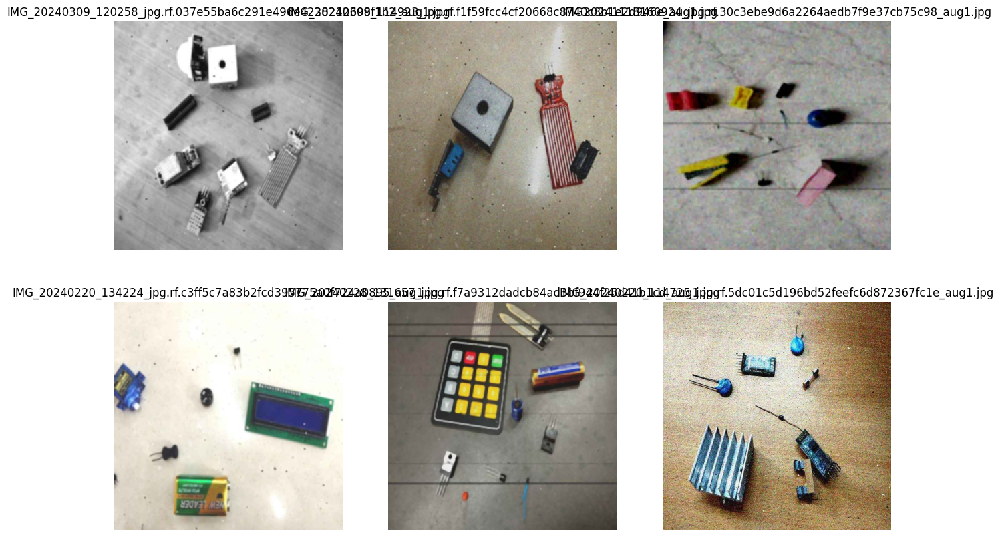

In [70]:
augmented_images = sorted(YOLO_TRAIN_IMAGE_DIR.glob("*_aug1.jpg"))

sample_augmented_images = random.sample(
    augmented_images,
    min(6, len(augmented_images)),
)

plt.figure(figsize=(15, 10))

for i, image_path in enumerate(sample_augmented_images):
    image = cv2.imread(str(image_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 3, i + 1)
    plt.imshow(image)
    plt.title(image_path.name)
    plt.axis("off")

plt.show()

# финальная проверка после аугментаций

In [71]:
missing_train, bad_train = check_yolo_labels(YOLO_TRAIN_IMAGE_DIR, YOLO_TRAIN_LABEL_DIR)
missing_valid, bad_valid = check_yolo_labels(YOLO_VALID_IMAGE_DIR, YOLO_VALID_LABEL_DIR)

print("missing train labels:", len(missing_train))
print("bad train labels:", len(bad_train))

print("missing valid labels:", len(missing_valid))
print("bad valid labels:", len(bad_valid))

assert len(missing_train) == 0
assert len(missing_valid) == 0
assert len(bad_train) == 0
assert len(bad_valid) == 0

missing train labels: 0
bad train labels: 0
missing valid labels: 0
bad valid labels: 0


# очистка памяти перед обучением

Перед запуском обучения очищаю память python и GPU-кэш, чтобы не было ошибки CUDA out of memory во время обучения модели

In [72]:
gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

print("CUDA:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    print("allocated GB:", round(torch.cuda.memory_allocated() / 1024**3, 3))
    print("reserved GB:", round(torch.cuda.memory_reserved() / 1024**3, 3))

CUDA: True
GPU: Tesla T4
allocated GB: 0.964
reserved GB: 1.238


# настройки модели

In [73]:
NUM_CLASSES = 52
IMAGE_SIZE = 640

YOLO_MODEL_NAME = "yolo11l.pt"
BATCH_SIZE = 4
EPOCHS = 30

RUN_NAME = "yolo11l_parts_seed993_aug"

DEVICE = 0 if torch.cuda.is_available() else "cpu"

print("NUM_CLASSES:", NUM_CLASSES)
print("IMAGE_SIZE:", IMAGE_SIZE)
print("MODEL:", YOLO_MODEL_NAME)
print("BATCH_SIZE:", BATCH_SIZE)
print("EPOCHS:", EPOCHS)
print("DEVICE:", DEVICE)

NUM_CLASSES: 52
IMAGE_SIZE: 640
MODEL: yolo11l.pt
BATCH_SIZE: 4
EPOCHS: 30
DEVICE: 0


# обучение YOLO-модели

In [74]:
yolo_model = YOLO(YOLO_MODEL_NAME)

yolo_results = yolo_model.train(
    data=YOLO_DATA_YAML_PATH.resolve().as_posix(),

    epochs=EPOCHS,
    imgsz=IMAGE_SIZE,
    batch=BATCH_SIZE,

    seed=SEED,
    device=DEVICE,
    workers=2,

    project="runs_yolo",
    name=RUN_NAME,
    exist_ok=True,

    pretrained=True,

    optimizer="AdamW",
    lr0=0.0015,
    lrf=0.01,
    weight_decay=0.0005,

    warmup_epochs=2.0,
    cos_lr=True,

    degrees=0.0,
    translate=0.0,
    scale=0.0,
    shear=0.0,
    perspective=0.0,

    flipud=0.2,
    fliplr=0.5,

    mosaic=0.10,
    mixup=0.0,
    copy_paste=0.0,
    close_mosaic=5,

    hsv_h=0.015,
    hsv_s=0.25,
    hsv_v=0.45,

    amp=True,
    cache=False,
    patience=6,
    plots=True,
    verbose=True,
)

Ultralytics 8.4.45 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=5, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/kaggle/working/yolo_dataset_seed993/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.2, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.25, hsv_v=0.45, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0015, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11l.pt, momentum=0.937, mosaic=0.1, multi_scale=0.0, name=yolo11l_parts_seed993_aug, nbs=64, nms=False, opset=None, optimize=False, optimizer=Adam

# Загрузка лучших весов модели (best.pt)

Наиболее важные:

- last.pt - веса после последней эпохи
- best.pt - веса модели с лучшим качеством на validation

In [75]:
BEST_YOLO_PATH = Path(yolo_results.save_dir) / "weights" / "best.pt"
LAST_YOLO_PATH = Path(yolo_results.save_dir) / "weights" / "last.pt"

print("BEST_YOLO_PATH:", BEST_YOLO_PATH)
print("LAST_YOLO_PATH:", LAST_YOLO_PATH)

print("best exists:", BEST_YOLO_PATH.exists())
print("last exists:", LAST_YOLO_PATH.exists())

assert BEST_YOLO_PATH.exists(), "best.pt нету"

best_yolo = YOLO(BEST_YOLO_PATH.as_posix())

print("best model:", BEST_YOLO_PATH)

BEST_YOLO_PATH: /kaggle/working/runs/detect/runs_yolo/yolo11l_parts_seed993_aug/weights/best.pt
LAST_YOLO_PATH: /kaggle/working/runs/detect/runs_yolo/yolo11l_parts_seed993_aug/weights/last.pt
best exists: True
last exists: True
best model: /kaggle/working/runs/detect/runs_yolo/yolo11l_parts_seed993_aug/weights/best.pt


# валидация лучшей модели

После загрузки best.pt модель дополнительно проверяется на validation-части

In [76]:
yolo_metrics = best_yolo.val(
    data=YOLO_DATA_YAML_PATH.resolve().as_posix(),
    imgsz=IMAGE_SIZE,
    batch=BATCH_SIZE,
    conf=0.001,
    iou=0.65,
    max_det=300,
    device=DEVICE,
    workers=2,
    plots=True,
    verbose=True,
)

print(yolo_metrics)

Ultralytics 8.4.45 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11l summary (fused): 191 layers, 25,319,404 parameters, 0 gradients, 86.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1686.7±422.3 MB/s, size: 81.1 KB)
val: Scanning /kaggle/working/yolo_dataset_seed993/valid/labels.cache... 255 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 255/255 107.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 64/64 3.8it/s 16.8s0.2s
                   all        255       1523        0.8      0.793      0.806       0.52
                     0         16         18      0.787      0.778      0.877      0.492
                     1         11         11      0.735      0.727      0.643      0.471
                     2         23         23       0.88      0.636      0.729      0.438
                     3         22         22      0.956       0.99      0.993      0.818
                  

# поиск и загрузка sample_submission.csv

Для отправки решения нужен файл в формате sample_submission.csv

Финальная таблица содержит два столбца:

- image_id
- PredictionString

In [77]:
sample_paths = list(ROOT_DIR.rglob("sample_submission.csv"))

if len(sample_paths) == 0 and KAGGLE_INPUT_DIR.exists():
    sample_paths = list(KAGGLE_INPUT_DIR.rglob("sample_submission.csv"))

if len(sample_paths) == 0:
    sample_paths = list(PROJECT_ROOT.rglob("sample_submission.csv"))

print(sample_paths)

assert len(sample_paths) > 0, "sample_submission.csv не найден"

SAMPLE_SUBMISSION_PATH = sample_paths[0]

sample_df = pd.read_csv(SAMPLE_SUBMISSION_PATH)

display(sample_df.head())
print(sample_df.shape)
print(sample_df.columns.tolist())

assert "image_id" in sample_df.columns
assert "PredictionString" in sample_df.columns

[PosixPath('/kaggle/input/datasets/vdoron/homework/sample_submission.csv')]


,image_id,PredictionString
0,IMG20240228122809_jpg.rf.bb184f37aa98d96f1db1a...,NaN
1,IMG20240228122949_jpg.rf.f763b523e7bb4e7250796...,NaN
2,IMG20240228122955_jpg.rf.18d6c6ad9c8c69153da34...,NaN
3,IMG20240228123115_jpg.rf.3b9ae83d0bc7242bafe52...,NaN
4,IMG20240228123131_jpg.rf.84cf43cf1c7a8d09dc507...,NaN


(424, 2)
['image_id', 'PredictionString']


# подготовка test map (соответствие image_id и test-изображений)

Тут создаю словарь, который связывает image_id из submission-файла с реальным путём к изображению

In [78]:
test_image_map = {}

for path in test_images:
    test_image_map[path.stem] = path
    test_image_map[path.name] = path

missing_test_files = []

for image_id in sample_df["image_id"].astype(str):
    if image_id not in test_image_map:
        missing_test_files.append(image_id)

print("Missing test files:", len(missing_test_files))

if len(missing_test_files) > 0:
    print(missing_test_files[:10])

assert len(missing_test_files) == 0

Missing test files: 0


# инференс YOLO на test

In [79]:
try:
    del results_generator
except:
    pass

try:
    del yolo_model
except:
    pass

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()
    torch.cuda.ipc_collect()

print("Memory cleared")
if torch.cuda.is_available():
    print("Allocated GB:", round(torch.cuda.memory_allocated() / 1024**3, 3))
    print("Reserved GB:", round(torch.cuda.memory_reserved() / 1024**3, 3))

Memory cleared
Allocated GB: 0.678
Reserved GB: 0.998


In [80]:
best_yolo = YOLO(BEST_YOLO_PATH.as_posix())

print("Loaded:", BEST_YOLO_PATH)

Loaded: /kaggle/working/runs/detect/runs_yolo/yolo11l_parts_seed993_aug/weights/best.pt


In [81]:
from tqdm.auto import tqdm

In [82]:
import gc
import torch

for name in [
    "results",
    "train_results",
    "metrics",
    "trainer",
    "model",
    "yolo_model",
    "best_model",
]:
    if name in globals():
        del globals()[name]

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()
    torch.cuda.ipc_collect()

print("GPU cache cleared")

GPU cache cleared


In [83]:
import gc
import cv2
import numpy as np
import pandas as pd
import torch
from tqdm.auto import tqdm

PRED_CONF_THRESHOLD = 0.001
PRED_IOU_THRESHOLD = 0.65
MAX_DETECTIONS = 200

INFER_BATCH_SIZE = 1

ordered_test_paths = [
    test_image_map[image_id]
    for image_id in sample_df["image_id"].astype(str)
]

submission_records = []

if torch.cuda.is_available():
    torch.cuda.empty_cache()
    torch.cuda.ipc_collect()

for start in tqdm(
    range(0, len(ordered_test_paths), INFER_BATCH_SIZE),
    total=(len(ordered_test_paths) + INFER_BATCH_SIZE - 1) // INFER_BATCH_SIZE,
    desc="YOLO test inference",
):
    batch_paths = ordered_test_paths[start:start + INFER_BATCH_SIZE]
    batch_ids = sample_df["image_id"].astype(str).iloc[start:start + INFER_BATCH_SIZE].tolist()

    with torch.inference_mode():
        batch_results = best_yolo.predict(
            source=[str(path) for path in batch_paths],
            imgsz=IMAGE_SIZE,
            conf=PRED_CONF_THRESHOLD,
            iou=PRED_IOU_THRESHOLD,
            max_det=MAX_DETECTIONS,
            device=DEVICE,
            augment=False,
            save=False,
            verbose=False,
            stream=False,
            batch=1,
            half=torch.cuda.is_available(),
        )

    for image_id, image_path, result in zip(batch_ids, batch_paths, batch_results):
        image = cv2.imread(str(image_path))

        if image is None:
            prediction_string = ""
            submission_records.append({
                "image_id": image_id,
                "PredictionString": prediction_string,
            })
            continue

        image_height, image_width = image.shape[:2]
        parts = []

        if result.boxes is not None and len(result.boxes) > 0:
            boxes = result.boxes.xyxy.detach().cpu().numpy()
            scores = result.boxes.conf.detach().cpu().numpy()
            labels = result.boxes.cls.detach().cpu().numpy().astype(int)

            order = np.argsort(-scores)

            boxes = boxes[order]
            scores = scores[order]
            labels = labels[order]

            for box, label, score in zip(boxes, labels, scores):
                x_min, y_min, x_max, y_max = box

                x_min = int(round(max(0, min(x_min, image_width - 1))))
                y_min = int(round(max(0, min(y_min, image_height - 1))))
                x_max = int(round(max(0, min(x_max, image_width - 1))))
                y_max = int(round(max(0, min(y_max, image_height - 1))))

                if x_max <= x_min or y_max <= y_min:
                    continue

                parts.extend([
                    str(int(label)),
                    f"{float(score):.6f}",
                    str(x_min),
                    str(y_min),
                    str(x_max),
                    str(y_max),
                ])

        prediction_string = " ".join(parts)

        submission_records.append({
            "image_id": image_id,
            "PredictionString": prediction_string,
        })

    del batch_results

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    gc.collect()

submission_df = pd.DataFrame(submission_records)

display(submission_df.head())

print("Submission shape:", submission_df.shape)
print(
    "Non-empty predictions:",
    (submission_df["PredictionString"].astype(str).str.len() > 0).sum()
)

YOLO test inference:   0%|          | 0/424 [00:00<?, ?it/s]

,image_id,PredictionString
0,IMG20240228122809_jpg.rf.bb184f37aa98d96f1db1a...,22 0.754883 500 332 566 388 7 0.670410 384 200...
1,IMG20240228122949_jpg.rf.f763b523e7bb4e7250796...,30 0.746094 46 109 364 441 0 0.686035 232 430 ...
2,IMG20240228122955_jpg.rf.18d6c6ad9c8c69153da34...,4 0.953613 139 54 224 208 43 0.778809 456 290 ...
3,IMG20240228123115_jpg.rf.3b9ae83d0bc7242bafe52...,43 0.653320 415 332 494 416 4 0.517578 181 430...
4,IMG20240228123131_jpg.rf.84cf43cf1c7a8d09dc507...,30 0.738770 1 170 257 424 39 0.345215 458 191 ...


Submission shape: (424, 2)
Non-empty predictions: 424


Всего test изображений: 424
Изображений с предсказаниями: 424


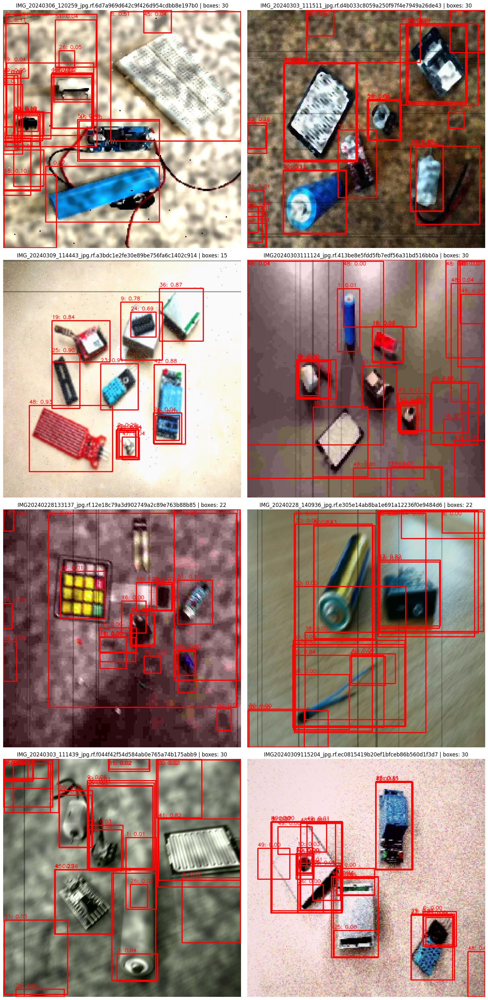

In [84]:
import random
import math
import cv2
import matplotlib.pyplot as plt

PREVIEW_N = 8
MAX_BOXES_PER_IMAGE = 30
MIN_SCORE_TO_DRAW = 0.001

def parse_prediction_string(prediction_string):
    if pd.isna(prediction_string):
        return []

    items = str(prediction_string).strip().split()

    if len(items) == 0:
        return []

    boxes = []

    for i in range(0, len(items), 6):
        if i + 5 >= len(items):
            break

        class_id = int(float(items[i]))
        score = float(items[i + 1])
        x_min = int(float(items[i + 2]))
        y_min = int(float(items[i + 3]))
        x_max = int(float(items[i + 4]))
        y_max = int(float(items[i + 5]))

        boxes.append({
            "class_id": class_id,
            "score": score,
            "box": [x_min, y_min, x_max, y_max],
        })

    return boxes


def draw_submission_prediction(image_path, prediction_string, max_boxes=30, min_score=0.001):
    image = cv2.imread(str(image_path))

    if image is None:
        raise FileNotFoundError(f"Не удалось открыть изображение: {image_path}")

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    predictions = parse_prediction_string(prediction_string)
    predictions = [p for p in predictions if p["score"] >= min_score]
    predictions = sorted(predictions, key=lambda x: -x["score"])[:max_boxes]

    for pred in predictions:
        class_id = pred["class_id"]
        score = pred["score"]
        x_min, y_min, x_max, y_max = pred["box"]

        cv2.rectangle(
            image,
            (x_min, y_min),
            (x_max, y_max),
            (255, 0, 0),
            2,
        )

        label_text = f"{class_id}: {score:.2f}"

        cv2.putText(
            image,
            label_text,
            (x_min, max(15, y_min - 5)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.45,
            (255, 0, 0),
            1,
            cv2.LINE_AA,
        )

    return image, predictions


preview_df = submission_df.copy()
preview_df["PredictionString"] = preview_df["PredictionString"].fillna("")

non_empty_df = preview_df[
    preview_df["PredictionString"].astype(str).str.strip().str.len() > 0
].copy()

print("Всего test изображений:", len(preview_df))
print("Изображений с предсказаниями:", len(non_empty_df))

if len(non_empty_df) > 0:
    preview_sample = non_empty_df.sample(
        n=min(PREVIEW_N, len(non_empty_df)),
        random_state=SEED,
    )
else:
    preview_sample = preview_df.sample(
        n=min(PREVIEW_N, len(preview_df)),
        random_state=SEED,
    )

cols = 2
rows = math.ceil(len(preview_sample) / cols)

plt.figure(figsize=(cols * 8, rows * 8))

for plot_idx, (_, row) in enumerate(preview_sample.iterrows(), start=1):
    image_id = str(row["image_id"])
    image_path = test_image_map[image_id]

    image, predictions = draw_submission_prediction(
        image_path=image_path,
        prediction_string=row["PredictionString"],
        max_boxes=MAX_BOXES_PER_IMAGE,
        min_score=MIN_SCORE_TO_DRAW,
    )

    plt.subplot(rows, cols, plot_idx)
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"{image_id} | boxes: {len(predictions)}")

plt.tight_layout()
plt.show()

# сохранение итогового sample_submission.csv

In [85]:
OUTPUT_PATH = WORK_DIR / "sample_submission.csv"

submission_df = submission_df[["image_id", "PredictionString"]].copy()
submission_df["PredictionString"] = submission_df["PredictionString"].fillna("")

submission_df.to_csv(OUTPUT_PATH, index=False)

print("Saved:", OUTPUT_PATH.resolve())
display(submission_df.head())

Saved: /kaggle/working/sample_submission.csv


,image_id,PredictionString
0,IMG20240228122809_jpg.rf.bb184f37aa98d96f1db1a...,22 0.754883 500 332 566 388 7 0.670410 384 200...
1,IMG20240228122949_jpg.rf.f763b523e7bb4e7250796...,30 0.746094 46 109 364 441 0 0.686035 232 430 ...
2,IMG20240228122955_jpg.rf.18d6c6ad9c8c69153da34...,4 0.953613 139 54 224 208 43 0.778809 456 290 ...
3,IMG20240228123115_jpg.rf.3b9ae83d0bc7242bafe52...,43 0.653320 415 332 494 416 4 0.517578 181 430...
4,IMG20240228123131_jpg.rf.84cf43cf1c7a8d09dc507...,30 0.738770 1 170 257 424 39 0.345215 458 191 ...


# анализ количества предсказанных объектов

После формирования submission дополнительно анализирую, сколько bounding box модель предсказывает на одно изображение

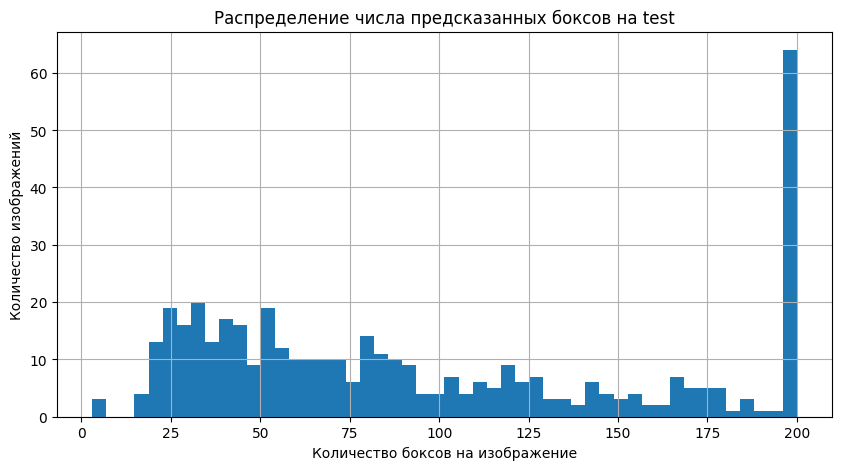

Среднее число боксов: 95.5872641509434
Медиана: 79.0
Максимум: 200
Пустых изображений: 0


In [86]:
box_counts = []

for pred_str in submission_df["PredictionString"].fillna(""):
    items = str(pred_str).strip().split()
    box_counts.append(len(items) // 6)

plt.figure(figsize=(10, 5))
plt.hist(box_counts, bins=50)
plt.xlabel("Количество боксов на изображение")
plt.ylabel("Количество изображений")
plt.title("Распределение числа предсказанных боксов на test")
plt.grid(True)
plt.show()

print("Среднее число боксов:", np.mean(box_counts))
print("Медиана:", np.median(box_counts))
print("Максимум:", np.max(box_counts))
print("Пустых изображений:", sum(c == 0 for c in box_counts))

# анализ confidence-score

confidence-score показывает, насколько модель уверена в каждом предсказанном объекте

Всего боксов: 40529


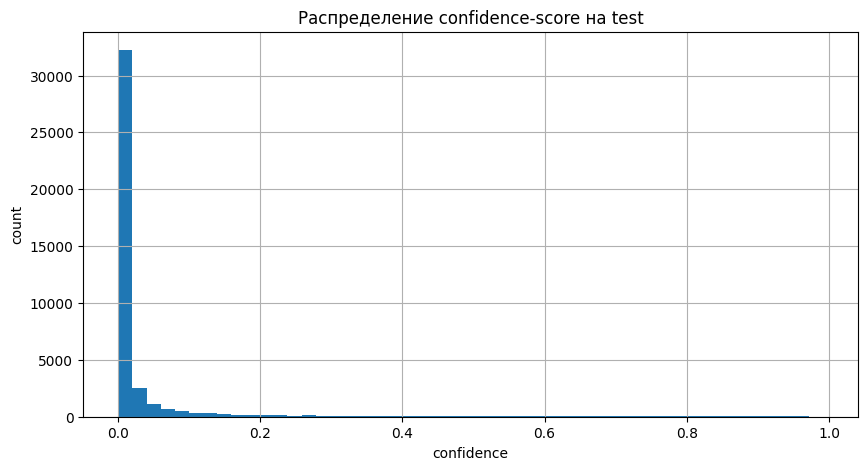

min: 0.001004
mean: 0.04173645500752547
median: 0.004086
max: 0.991211


In [87]:
all_scores = []

for pred_str in submission_df["PredictionString"].fillna(""):
    items = str(pred_str).strip().split()

    for i in range(0, len(items), 6):
        if i + 5 >= len(items):
            continue

        score = float(items[i + 1])
        all_scores.append(score)

print("Всего боксов:", len(all_scores))

if len(all_scores) > 0:
    plt.figure(figsize=(10, 5))
    plt.hist(all_scores, bins=50)
    plt.xlabel("confidence")
    plt.ylabel("count")
    plt.title("Распределение confidence-score на test")
    plt.grid(True)
    plt.show()

    print("min:", np.min(all_scores))
    print("mean:", np.mean(all_scores))
    print("median:", np.median(all_scores))
    print("max:", np.max(all_scores))

# финальная проверка файла

In [88]:
check_df = pd.read_csv(OUTPUT_PATH)

print(check_df.shape)
print(check_df.columns.tolist())

check_df["PredictionString"] = check_df["PredictionString"].fillna("")

lengths = check_df["PredictionString"].astype(str).apply(
    lambda x: len(x.split()) if x.strip() != "" else 0
)

bad_rows = check_df[lengths % 6 != 0]

print("Bad rows:", len(bad_rows))
print("NaN count:", check_df["PredictionString"].isna().sum())

assert list(check_df.columns) == ["image_id", "PredictionString"]
assert len(check_df) == len(sample_df)
assert len(bad_rows) == 0

display(check_df.head())

print("готов:", OUTPUT_PATH.resolve())

(424, 2)
['image_id', 'PredictionString']
Bad rows: 0
NaN count: 0


,image_id,PredictionString
0,IMG20240228122809_jpg.rf.bb184f37aa98d96f1db1a...,22 0.754883 500 332 566 388 7 0.670410 384 200...
1,IMG20240228122949_jpg.rf.f763b523e7bb4e7250796...,30 0.746094 46 109 364 441 0 0.686035 232 430 ...
2,IMG20240228122955_jpg.rf.18d6c6ad9c8c69153da34...,4 0.953613 139 54 224 208 43 0.778809 456 290 ...
3,IMG20240228123115_jpg.rf.3b9ae83d0bc7242bafe52...,43 0.653320 415 332 494 416 4 0.517578 181 430...
4,IMG20240228123131_jpg.rf.84cf43cf1c7a8d09dc507...,30 0.738770 1 170 257 424 39 0.345215 458 191 ...


готов: /kaggle/working/sample_submission.csv
